In [3]:
import sys
import os
project_root = os.path.abspath(os.path.join(os.getcwd(), '..'))
src_dir = os.path.join(project_root, 'src')
sys.path.append(src_dir)
import spectra as spectra
from utils.plotters import visualize_geometry, colorplot
from utils.geometries import trigonal_plane, tetrahedron

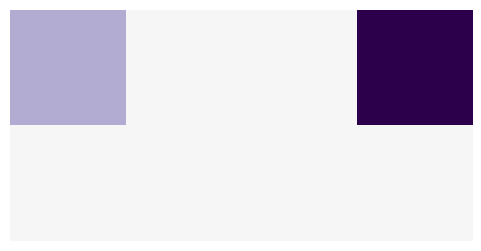

In [5]:
import jax.numpy as jnp
import matplotlib.pyplot as plt

def colorplot(arr: jnp.ndarray):
    """Plot spectra"""
    # TODO: add functionality to plot multiple spectra (properly take into account max and min)
    # TODO: add functionality to change dimensions of figure
    reshaped_arr = arr.reshape(2, 4)  # Reshape the array into 3 rows of 5 components each
    plt.figure(figsize=(15, 3))  # Adjust the figure size to accommodate the reshaped array
    plt.axis("off")
    vmax = jnp.maximum(jnp.abs(jnp.min(reshaped_arr)), jnp.max(reshaped_arr))  # Compute vmax using the reshaped array
    return plt.imshow(reshaped_arr, cmap="PuOr", vmin=-vmax, vmax=vmax)  # Plot the reshaped array

bispectrum = spectra.Spectra(lmax=3, order=2)
true_spectrum = bispectrum.compute_geometry_spectra(tetrahedron)
colorplot(true_spectrum)

In [2]:
true_geometry = trigonal_plane
visualize_geometry(true_geometry)

In [3]:
true_signal = spectra.sum_of_diracs(true_geometry, lmax=4)
bispectrum = spectra.Spectra(lmax=4, order=2)
true_spectrum = bispectrum.compute_geometry_spectra(true_geometry)

In [4]:
predicted_geometry = bispectrum.invert(true_spectrum)
visualize_geometry(predicted_geometry, show_points=True)

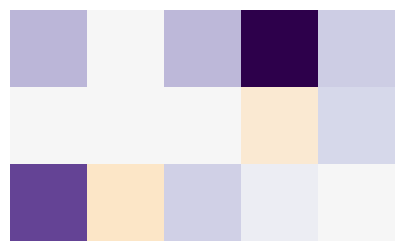

In [5]:
colorplot(true_spectrum)

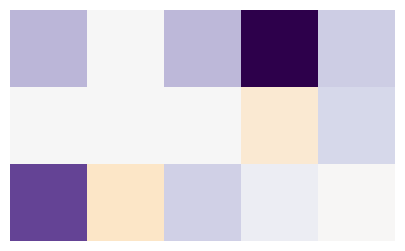

In [6]:
colorplot(bispectrum.compute_geometry_spectra(predicted_geometry))

In [7]:
import jax
import jax.numpy as jnp
from utils.alignment import align_signals, find_best_random_quaternion

predicted_signal = spectra.sum_of_diracs(predicted_geometry, lmax=4)
true_signal = spectra.sum_of_diracs(trigonal_plane, lmax=4)

key = jax.random.PRNGKey(0)
initial_quaternion = find_best_random_quaternion(key, predicted_signal, true_signal)
quaternion, _ = align_signals(predicted_signal, true_signal, initial_quaternion)


/home/gridsan/tphung/pyspectra/venv/lib/python3.10/site-packages/jax/_src/numpy/array_methods.py:66: UserWarning:

Explicitly requested dtype float64 requested in astype is not available, and will be truncated to dtype float32. To enable more dtypes, set the jax_enable_x64 configuration option or the JAX_ENABLE_X64 shell environment variable. See https://github.com/google/jax#current-gotchas for more.



In [8]:
import jax.numpy as jnp

def rotate_points_quaternion(q, points):
    """
    Rotate 3D points using a quaternion.
    
    Parameters:
    q : array-like
        Quaternion in format [w, x, y, z] where w is the scalar component
        and [x, y, z] is the vector component. Must be a unit quaternion.
    points : array-like
        Array of points with shape (N, 3) where N is the number of points
        and each point is [x, y, z]
        
    Returns:
    jax.numpy.ndarray
        Array of rotated points with same shape as input points
    """
    # Convert inputs to jax arrays
    q = jnp.array(q, dtype=float)
    points = jnp.array(points, dtype=float)
    
    # Normalize quaternion if not already unit length
    q = q / jnp.linalg.norm(q)
    
    # Extract components
    w, x, y, z = q
    
    # Construct rotation matrix from quaternion
    R = jnp.array([
        [1 - 2*y*y - 2*z*z,     2*x*y - 2*w*z,     2*x*z + 2*w*y],
        [    2*x*y + 2*w*z, 1 - 2*x*x - 2*z*z,     2*y*z - 2*w*x],
        [    2*x*z - 2*w*y,     2*y*z + 2*w*x, 1 - 2*x*x - 2*y*y]
    ])
    
    # Apply rotation to all points
    rotated_points = jnp.dot(points, R.T)
    
    return rotated_points

In [9]:
rotated_predicted_geometry = rotate_points_quaternion(quaternion, predicted_geometry)
visualize_geometry(rotated_predicted_geometry, show_points=True)

In [10]:
visualize_geometry(true_geometry, show_points=True)

In [11]:
points = rotated_predicted_geometry.copy()
points_norms = jnp.linalg.norm(points, axis=1, keepdims=True)
normalized_points = points / points_norms

point_stacked_indices = []
indices_left = set(range(len(points)))
while len(indices_left):
    point = normalized_points[next(iter(indices_left))]
    stacked_indices = jnp.where(jnp.dot(normalized_points, point) > 0.99)[0]
    point_stacked_indices.append(stacked_indices)
    indices_left = indices_left - set(stacked_indices.tolist())

original_points = []
for stacked_indices in point_stacked_indices:
    normalized_point = normalized_points[stacked_indices[0]]
    norm = points_norms[stacked_indices].sum()
    original_points.append(normalized_point * norm)

original_points

[Array([ 8.5658175e-01, -5.0398040e-01, -1.6149657e-05], dtype=float32),
 Array([ 0.00739469,  0.99168015, -0.00557042], dtype=float32),
 Array([-0.87219924, -0.49849185, -0.01075328], dtype=float32)]

In [12]:
original_points

[Array([ 8.5658175e-01, -5.0398040e-01, -1.6149657e-05], dtype=float32),
 Array([ 0.00739469,  0.99168015, -0.00557042], dtype=float32),
 Array([-0.87219924, -0.49849185, -0.01075328], dtype=float32)]

In [13]:
visualize_geometry(jnp.array(original_points), show_points=True)

In [14]:
visualize_geometry(true_geometry, show_points=True)

In [15]:
def stack_points(points):
    points_norms = jnp.linalg.norm(points, axis=1, keepdims=True)
    normalized_points = points / points_norms

    point_stacked_indices = []
    indices_left = set(range(len(points)))
    while len(indices_left):
        point = normalized_points[next(iter(indices_left))]
        stacked_indices = jnp.where(jnp.dot(normalized_points, point) > 0.99)[0]
        point_stacked_indices.append(stacked_indices)
        indices_left = indices_left - set(stacked_indices.tolist())

    original_points = []
    for stacked_indices in point_stacked_indices:
        normalized_point = normalized_points[stacked_indices[0]]
        norm = points_norms[stacked_indices].sum()
        original_points.append(normalized_point * norm)

    return jnp.array(original_points)

original_points = stack_points(rotated_predicted_geometry)

In [16]:
original_points

Array([[ 8.5658175e-01, -5.0398040e-01, -1.6149657e-05],
       [ 7.3946887e-03,  9.9168015e-01, -5.5704187e-03],
       [-8.7219924e-01, -4.9849185e-01, -1.0753284e-02]], dtype=float32)

In [17]:
true_geometry


Array([[ 0.   ,  1.   ,  0.   ],
       [ 0.866, -0.5  ,  0.   ],
       [-0.866, -0.5  ,  0.   ]], dtype=float32)

In [18]:
def point_distance(points1: jnp.ndarray, points2: jnp.ndarray) -> float:
    """Calculate the sum of minimum distances from each point in points1 to points2.
    
    This function computes an asymmetric distance measure between two sets of points,
    typically used when points1 represents predicted/perturbed points and points2
    represents ground truth points. For each point in points1, it finds the distance
    to its closest point in points2 and sums these minimum distances.

    Args:
        points1: Array of shape (N, D) representing N predicted/perturbed points in D dimensions.
               Each row represents a point.
        points2: Array of shape (M, D) representing M ground truth points in D dimensions.
               Each row represents a point.
    
    Returns:
        float: Sum of the minimum distances from each point in points1 to any point
              in points2. A smaller value indicates better alignment between the point sets.
    """
    # Compute pairwise distances between all points
    distances = jnp.linalg.norm(
        points1[:, None, :] - points2[None, :, :],
        axis=-1
    )
    
    # Find minimum distances from each point in points1 to points2
    min_distances = jnp.min(distances, axis=1)
    
    # Return sum of all minimum distances
    return jnp.sum(min_distances)

point_distance(original_points, true_geometry)

Array(0.03517549, dtype=float32)

In [19]:
true_signal = spectra.sum_of_diracs(true_geometry, lmax=4)
true_signal.array

Array([ 2.3872891e-01,  0.0000000e+00, -1.4901161e-08,  0.0000000e+00,
        0.0000000e+00,  0.0000000e+00,  1.3346234e-01,  0.0000000e+00,
       -2.3114319e-01,  0.0000000e+00,  0.0000000e+00,  0.0000000e+00,
        3.9476085e-01,  0.0000000e+00,  3.0578044e-01,  0.0000000e+00,
        0.0000000e+00,  0.0000000e+00,  0.0000000e+00,  0.0000000e+00,
        1.0071003e-01,  0.0000000e+00, -1.5014739e-01,  0.0000000e+00,
        1.9860291e-01], dtype=float32)

In [20]:
predicted_signal = spectra.sum_of_diracs(original_points, lmax=4)
predicted_signal.array

Array([ 2.3795484e-01, -1.1333674e-03, -1.4874861e-03, -2.2521582e-03,
        2.8601319e-03,  1.7838925e-03,  1.3286957e-01, -6.9784583e-05,
       -2.3044094e-01,  3.4553036e-03, -3.8052392e-03,  9.3988013e-03,
        3.9252627e-01, -3.1932890e-03,  3.0578846e-01,  4.0529268e-03,
       -4.9606860e-03, -1.6729236e-03,  1.7329493e-03, -3.1971931e-04,
        9.7582489e-02, -5.4919347e-03, -1.5193345e-01, -6.0325740e-03,
        1.9748390e-01], dtype=float32)

In [21]:
jnp.linalg.norm(true_signal.array - predicted_signal.array)

Array(0.01670458, dtype=float32)

In [22]:
from utils.alignment import spherical_harmonic_distance

spherical_harmonic_distance(true_signal, predicted_signal)

Array(0.01670458, dtype=float32)